<a href="https://colab.research.google.com/github/tpavan03/Phishing-Detection/blob/main/SHAP_LIME_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import os

In [ ]:
df = pd.read_csv(r'PhiUSIIL_Phishing_URL_Dataset.csv')

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
from sklearn.preprocessing import MinMaxScaler

all_columns = df.columns.tolist()

numerical_features = [col for col in all_columns if col not in ['FILENAME', 'Domain', 'TLD', 'URL', 'Title', 'label']]

X = df[numerical_features]

scaler = MinMaxScaler()
scaler.fit(X)

X_normalized = scaler.transform(X)

df[numerical_features] = X_normalized

In [ ]:
X = df.drop([ 'FILENAME','Domain','TLD','URL', 'Title','label'], axis=1)
y = df['label']
X.fillna(0, inplace=True)
y.fillna(0, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
model = keras.Sequential([
    layers.Input(shape=(X_train.shape[1],)), # Input layer
    layers.Dense(128, activation='relu'),    # Hidden layer 1
    layers.Dense(64, activation='relu'),    # Hidden layer 2
    layers.Dense(32, activation='relu'),    # Hidden layer 3
    layers.Dense(16, activation='relu'),     # Hidden layer 4
    layers.Dense(8, activation='relu'),     # Hidden layer 5
    layers.Dense(1, activation='sigmoid')   # Output layer (sigmoid for binary classification)
])
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int)

Epoch 1/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step - accuracy: 0.9940 - loss: 0.0224 - val_accuracy: 0.9998 - val_loss: 9.1678e-04
Epoch 2/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9998 - loss: 5.1510e-04 - val_accuracy: 0.9998 - val_loss: 7.0805e-04
Epoch 3/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9999 - loss: 5.4928e-04 - val_accuracy: 0.9999 - val_loss: 5.7261e-04
Epoch 4/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9999 - loss: 3.7422e-04 - val_accuracy: 0.9998 - val_loss: 4.2194e-04
Epoch 5/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 1.0000 - loss: 1.6456e-04 - val_accuracy: 0.9998 - val_loss: 4.9492e-04
Epoch 6/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.9999 - loss: 4.3527e-04 - val_accuracy: 0.9998 - val_loss: 4.5335e-04
Epoch 7/10
4127/4127 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9999 - loss: 2.7428e-04 - val_accuracy: 0.9999 - val_loss: 2.6220e-04
Epoch 8/10
4127/4127 ━━━━━━━━━━━━━━━━

In [ ]:
!pip install shap

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
6675/6675 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

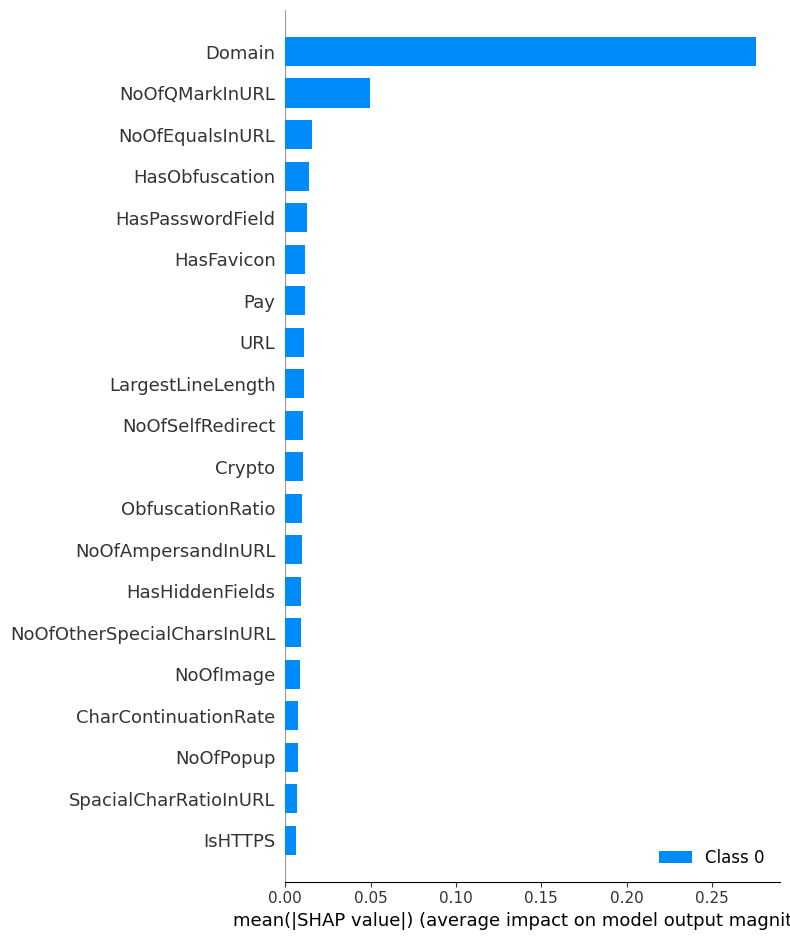

In [ ]:
import shap

explainer = shap.KernelExplainer(model.predict, X_train[:100])

shap_values = explainer.shap_values(X_test[:100])

shap.force_plot(explainer.expected_value[0], shap_values[0][0], X_test[0])

shap.summary_plot(shap_values, X_test, feature_names=df.columns)


In [ ]:
shap.initjs()

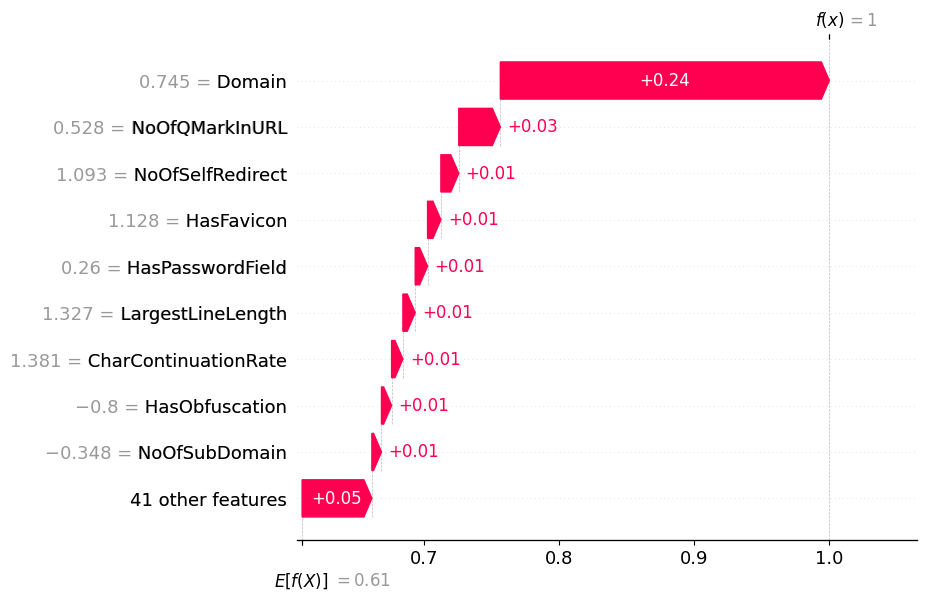

In [ ]:
import shap

shap_exp = shap.Explanation(
    values=shap_values[0][0],
    base_values=explainer.expected_value[0],
    data=X_test[0],
    feature_names=df.columns
)

shap.waterfall_plot(shap_exp)

SHAP Values Shape: (100, 50)
X_test Shape: (100, 50)


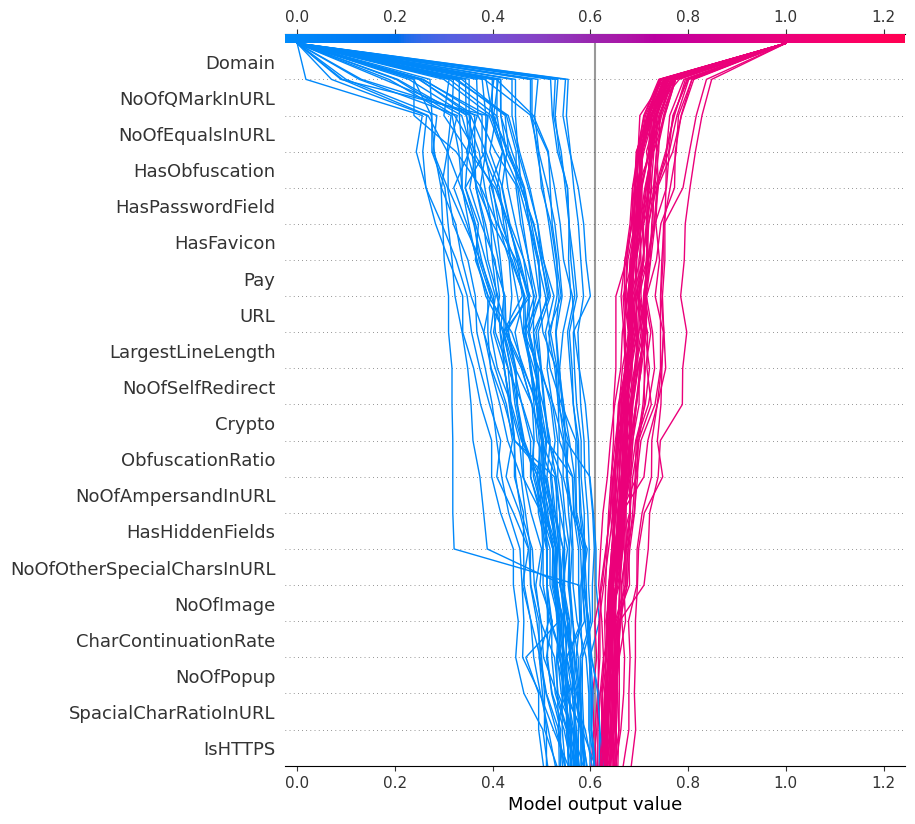

In [ ]:

print(f"SHAP Values Shape: {shap_values[0].shape}")
print(f"X_test Shape: {X_test[:100].shape}")

feature_names = df.columns[:X_test.shape[1]].tolist()

shap.decision_plot(
    explainer.expected_value[0],
    shap_values[0],
    X_test[:100],
    feature_names=feature_names
)

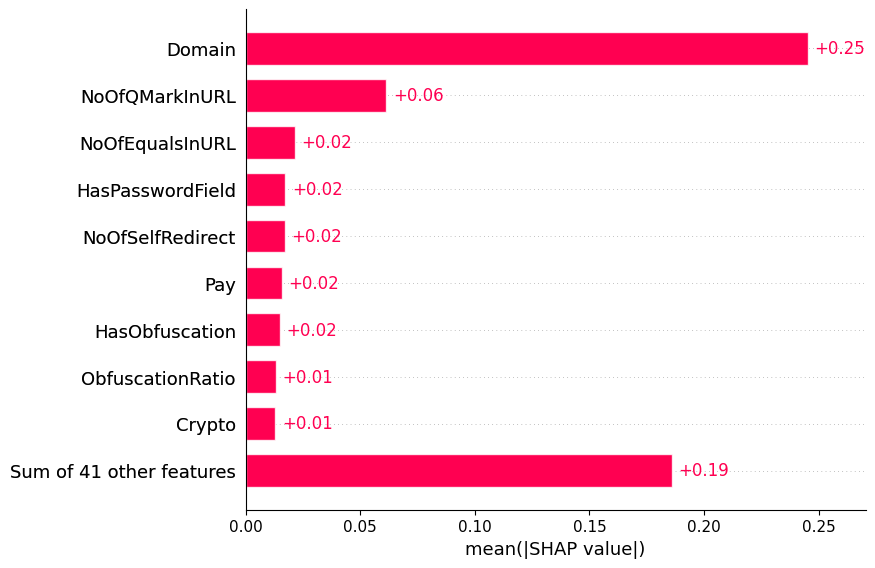

In [ ]:
shap_values_explanation = shap.Explanation(values=shap_values[0], base_values=explainer.expected_value[0], data=X_test_subset, feature_names=feature_names)

shap.plots.bar(shap_values_explanation)

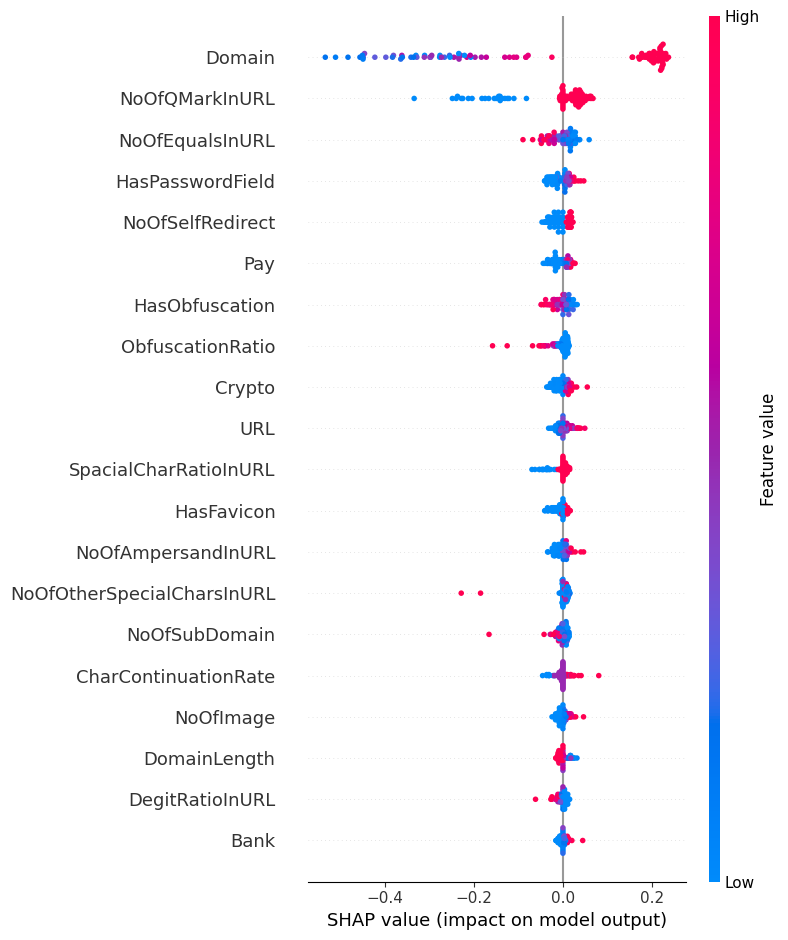

In [ ]:
shap.summary_plot(np.mean(shap_values, axis=0), X_test_subset, feature_names=feature_names)

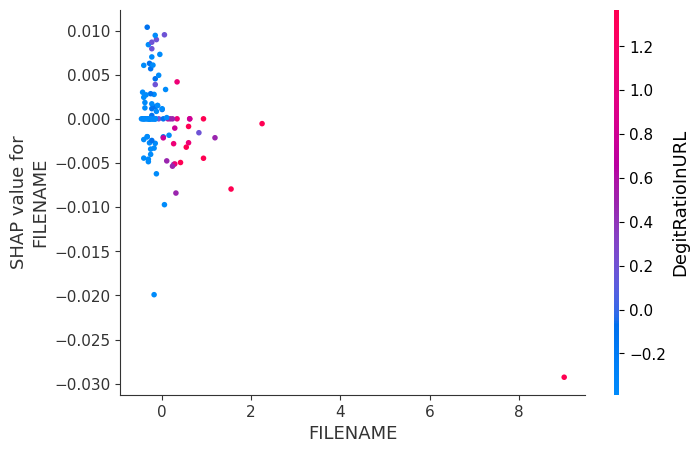

In [ ]:
shap_values_subset = shap_values[0]
X_test_subset = X_test[:100]

feature_index = 0

if feature_index < shap_values_subset.shape[1]:
    shap.dependence_plot(feature_index, shap_values_subset, X_test_subset, feature_names=df.columns)
else:
    print(f"Feature index {feature_index} is out of bounds for SHAP values.")

In [ ]:
!pip install lime

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


In [ ]:
import lime
import lime.lime_tabular

def predict_fn(X):
    probs_class_1 = model.predict(X)
    probs_class_0 = 1 - probs_class_1
    return np.column_stack((probs_class_0, probs_class_1))

In [ ]:
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=df.columns,
    class_names=['Class 0', 'Class 1'],
    mode='classification'
)

i = 0

exp = explainer.explain_instance(
    X_test[i],
    predict_fn,
    num_features=10,
    labels=(1,)
)

exp.show_in_notebook(show_table=True)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


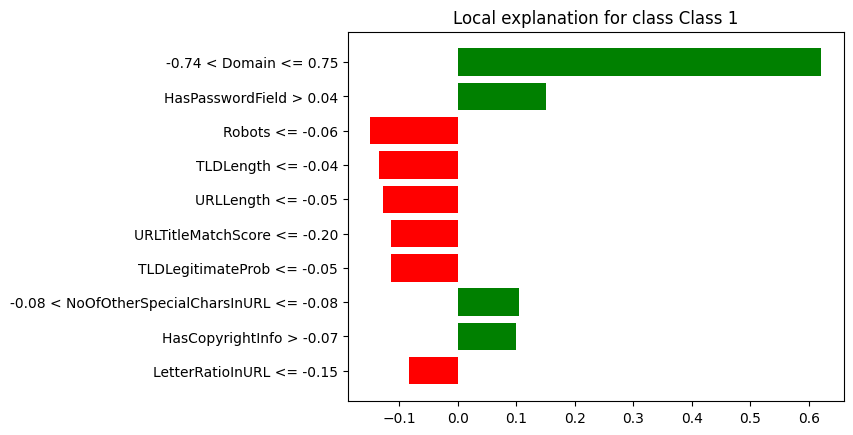

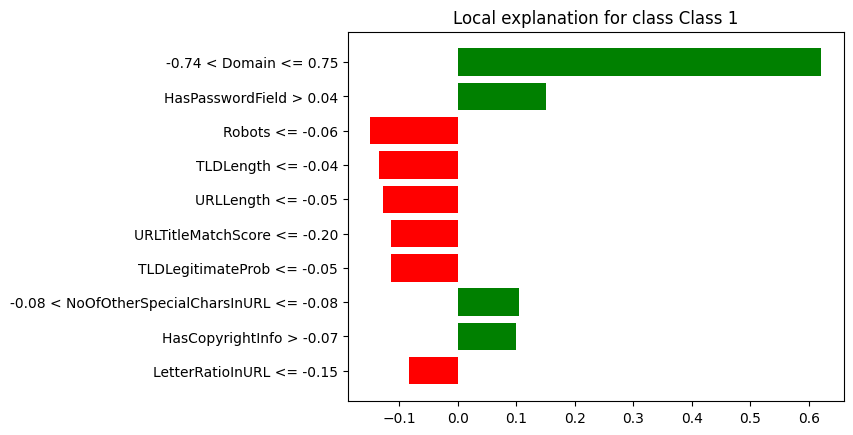

In [ ]:
exp.show_in_notebook(show_table=True)

exp.as_pyplot_figure()

In [ ]:
for i in range(5):
    exp = explainer.explain_instance(X_test[i], predict_fn, num_features=10)
    exp.show_in_notebook(show_table=True)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
